## NOTEBOOK TESIS

En primer lugar importo las librerias necesarias para trabajar la tesis 

In [1]:
import pandasql as ps
import pandas as pd
import chart_studio.plotly as py
import plotly.graph_objs as go
# Offline mode
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected='true')
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
from torch.utils.data import random_split, TensorDataset  
from torch.autograd import Variable 
import numpy as np
import os
import statsmodels as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, acf, pacf
from statsmodels.tsa import api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn import preprocessing

### Base Demanda Epec

En esta sección voy a cargar los data frame y organizar las tablas para visualizarlas y limpiarlas

In [2]:
# Definir el separador y cargar el archivo CSV
separador = ';'
trainv6 = pd.read_csv('./../bases/demandaepecv6csv.csv', sep=separador, encoding='ISO-8859-1')

# Eliminar filas con valores nulos y restablecer el índice
trainv6 = trainv6.dropna()
trainv6 = trainv6.reset_index(drop=True)

#Para ordenar la columna Fecha del data frame para que pase de tener el formato de pandas 21/7/2023 23:00 al formato '2019-12-31 00:00:00'
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'], format='%d/%m/%Y %H:%M')
trainv6['Fecha'] = trainv6['Fecha'].dt.strftime('%Y-%m-%d %H:%M:%S')

# Duplicar la columna 'Fecha sin hora' y convertirla al formato '2019-01'
trainv6['Fecha-Mes'] = pd.to_datetime(trainv6['Fecha sin hora'], format='%d/%m/%Y').dt.strftime('%Y-%m')

# Reordenar las columnas fecha, fecha sin hora y fecha-mes
column_order = ['Fecha', 'Fecha sin hora', 'Fecha-Mes'] + [col for col in trainv6.columns if col not in ['Fecha', 'Fecha sin hora', 'Fecha-Mes']]
trainv6 = trainv6[column_order]

#Ahora vamos a copiar la columna Fecha a otra columna y usar la funcion pop para extraer la columna y guardarla en una variable temporal
trainv6['Fecha_copia'] = trainv6['Fecha']
fecha_copia = trainv6.pop('Fecha_copia')

# Usando insert() para insertar la columna en la posición deseada con el nuevo nombre
posicion_deseada = trainv6.columns.get_loc('Demanda')
trainv6.insert(posicion_deseada, 'Fecha_columna', fecha_copia)

# Ordena el DataFrame por la columna 'Fecha'
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])
trainv6 = trainv6.sort_values(by='Fecha')

# Convertir las columnas a números en formato float
trainv6['Demanda'] = trainv6['Demanda'].str.replace(',', '.').astype(float)
trainv6['Temperatura'] = trainv6['Temperatura'].str.replace(',', '.').astype(float)
columnas_a_convertir_float = ['Potencia maxima', 'E valle', 'E resto', 'E pico', 'E total', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']
trainv6[columnas_a_convertir_float] = trainv6[columnas_a_convertir_float].replace(',', '.', regex=True).astype(float)

# Convertir la columna 'Fecha sin hora' y 'Fecha-Mes' a tipo datetime
trainv6['Fecha sin hora'] = pd.to_datetime(trainv6['Fecha sin hora'], format='%d/%m/%Y')
trainv6['Fecha-Mes'] = pd.to_datetime(trainv6['Fecha-Mes'], format='%Y-%m')

#Mostrar el data frame:
trainv6

,Fecha,Fecha sin hora,Fecha-Mes,Ano,Mes,Dia,Dia de la semana,Hora-num,Hora,Fecha_columna,...,E pico,E total,Nombre de la semana,Tipo de dia,Laborabilidad,Estacion,Temperatura,Humedad,Acumulacion de lluvia,Rafaga de viento
0,2019-01-01 00:00:00,2019-01-01,2019-01-01,2019,1,1,1,0,00:00:00,2019-01-01 00:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.80,65.32,0.0,11.3
1,2019-01-01 01:00:00,2019-01-01,2019-01-01,2019,1,1,1,1,01:00:00,2019-01-01 01:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.55,65.62,0.0,0.0
2,2019-01-01 02:00:00,2019-01-01,2019-01-01,2019,1,1,1,2,02:00:00,2019-01-01 02:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.40,66.32,0.0,0.0
3,2019-01-01 03:00:00,2019-01-01,2019-01-01,2019,1,1,1,3,03:00:00,2019-01-01 03:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.40,66.75,0.0,0.0
4,2019-01-01 04:00:00,2019-01-01,2019-01-01,2019,1,1,1,4,04:00:00,2019-01-01 04:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.35,68.05,0.0,36.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39403,2023-06-30 19:00:00,2023-06-30,2023-06-01,2023,6,30,4,19,19:00:00,2023-06-30 19:00:00,...,7396.32,31532.26,viernes,Habil,1,Invierno,14.67,52.32,0.0,138.3
39404,2023-06-30 20:00:00,2023-06-30,2023-06-01,2023,6,30,4,20,20:00:00,2023-06-30 20:00:00,...,7396.32,31532.26,viernes,Habil,1,Invierno,13.32,55.32,0.0,114.2
39405,2023-06-30 21:00:00,2023-06-30,2023-06-01,2023,6,30,4,21,21:00:00,2023-06-30 21:00:00,...,7396.32,31532.26,viernes,Habil,1,Invierno,12.22,58.77,0.0,82.0
39406,2023-06-30 22:00:00,2023-06-30,2023-06-01,2023,6,30,4,22,22:00:00,2023-06-30 22:00:00,...,7396.32,31532.26,viernes,Habil,1,Invierno,11.65,60.67,0.0,100.6


In [3]:
# Supongamos que 'trainv6' es tu DataFrame
columnas_trainv6 = trainv6.columns.tolist()

# Muestra la lista de columnas
print(columnas_trainv6)

['Fecha', 'Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']


Para armar un resultado por Año sobre la media de las principales variables 

In [4]:
# Asegúrate de que 'Fecha' sea de tipo datetime
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])

# Extraer el año y crear una nueva columna llamada 'Año'
trainv6['Año'] = trainv6['Fecha'].dt.year

# Lista de columnas para las cuales deseas calcular la media
columnas_para_media = [
    'Demanda', 'Potencia maxima','Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento'
    
]

# Calcular la media después de agrupar por año
resultados_por_año = trainv6.groupby('Año')[columnas_para_media].mean()
resultados_por_año


,Demanda,Potencia maxima,Temperatura,Humedad,Acumulacion de lluvia,Rafaga de viento
Año,,,,,,
2019,1044.564420,1294.076110,19.632578,57.078430,0.054566,53.311815
2020,1028.638506,1268.312787,20.059193,49.269910,0.105760,101.152880
2021,1072.412330,1309.638986,18.353556,60.487559,0.076142,97.339680
2022,1150.634615,1399.769836,19.110739,51.526068,0.052397,120.638870
2023,1198.153810,1450.095856,21.537539,59.429655,0.075046,115.536901


 ### Visualización de variables para predecir

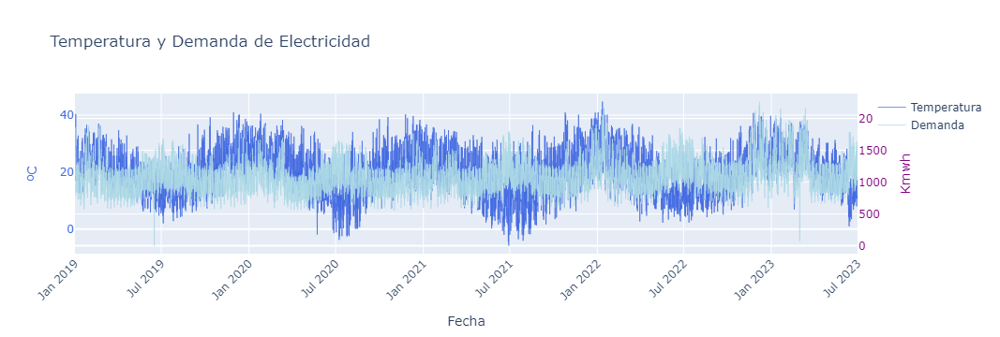

In [5]:
from matplotlib import pyplot as plt
plt.style.use('default')

# Crear y mostrar el gráfico
layout_temp = go.Layout(
    title='Temperatura y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M6'),  # Alinea las etiquetas y establece un intervalo de 6 meses
    yaxis=dict(title='ºC', color='royalblue', titlefont=dict(size=14)),
    yaxis2=dict(title='Kmwh', color='purple', overlaying='y', side='right', titlefont=dict(size=14))
)

temp = go.Scatter(x=trainv6['Fecha'], y=trainv6['Temperatura'], name='Temperatura', line=dict(color='royalblue', width=0.7), yaxis='y')
dem = go.Scatter(x=trainv6['Fecha'], y=trainv6['Demanda'], name='Demanda', line=dict(color='lightblue', width=0.7), yaxis='y2')

fig = go.Figure(data=[temp, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

fig.show()

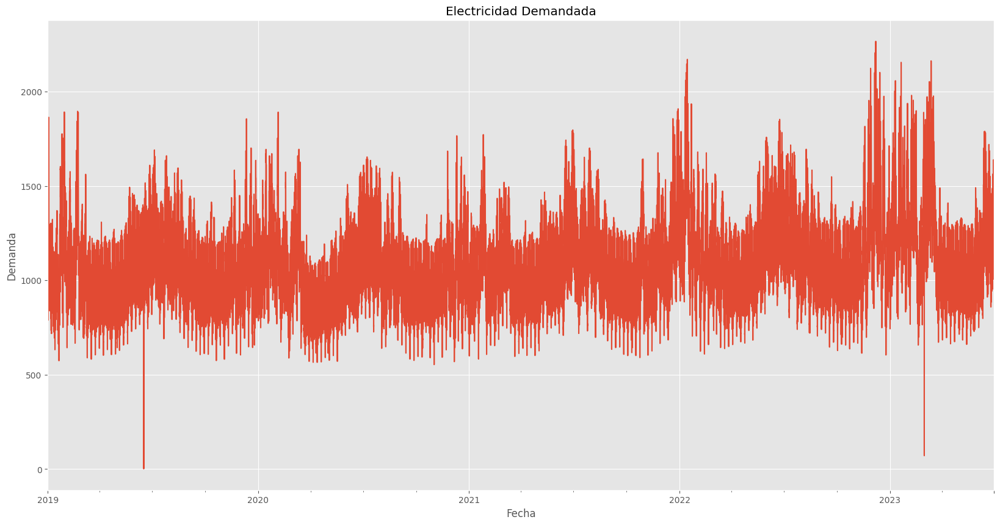

In [6]:
plt.style.use('ggplot')

# Establecer 'Fecha ' como el índice
trainv6.set_index('Fecha', inplace=True)

# Crear el gráfico con la columna 'Demanda' en el eje y
trainv6['Demanda'].plot(title='Electricidad Demandada', figsize=(20, 10))

# Añadir etiquetas a los ejes
plt.xlabel('Fecha')
plt.ylabel('Demanda')
plt.show()

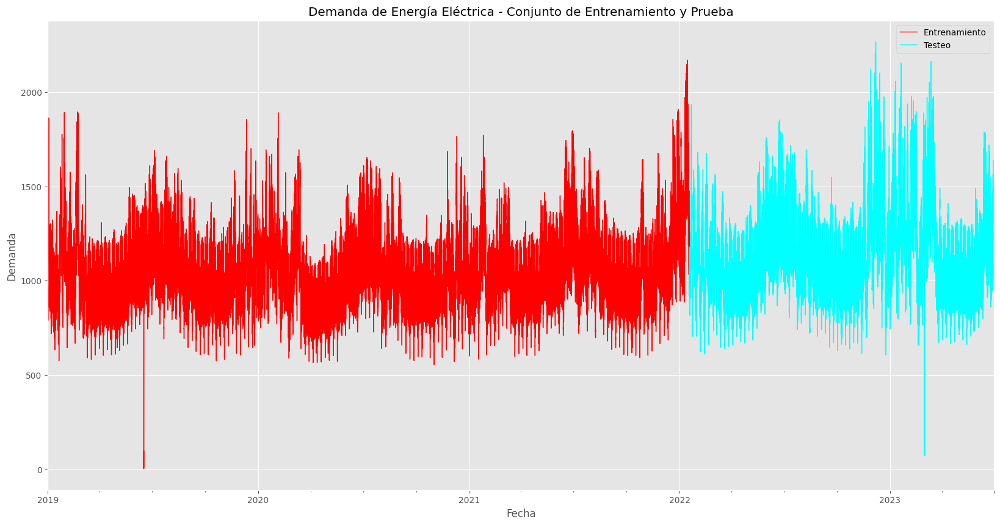

In [7]:
train_size = int(len(trainv6)*0.678)
test_size = len(trainv6) - train_size
train, test = trainv6.iloc[0:train_size, :], trainv6.iloc[train_size:len(trainv6), :]
fig, ax = plt.subplots(figsize=(20, 10)) # Crear una figura y un eje para la visualización
train.Demanda.plot(ax=ax, label='Entrenamiento', linewidth=1, c = 'red')
test.Demanda.plot(ax=ax, label='Testeo', linewidth=1, c = 'cyan')
plt.savefig('Demanda_train_test.pdf')
ax.set_title('Demanda de Energía Eléctrica - Conjunto de Entrenamiento y Prueba')# Configurar título y etiquetas de ejes
ax.set_xlabel('Fecha')
ax.set_ylabel('Demanda')
ax.legend()

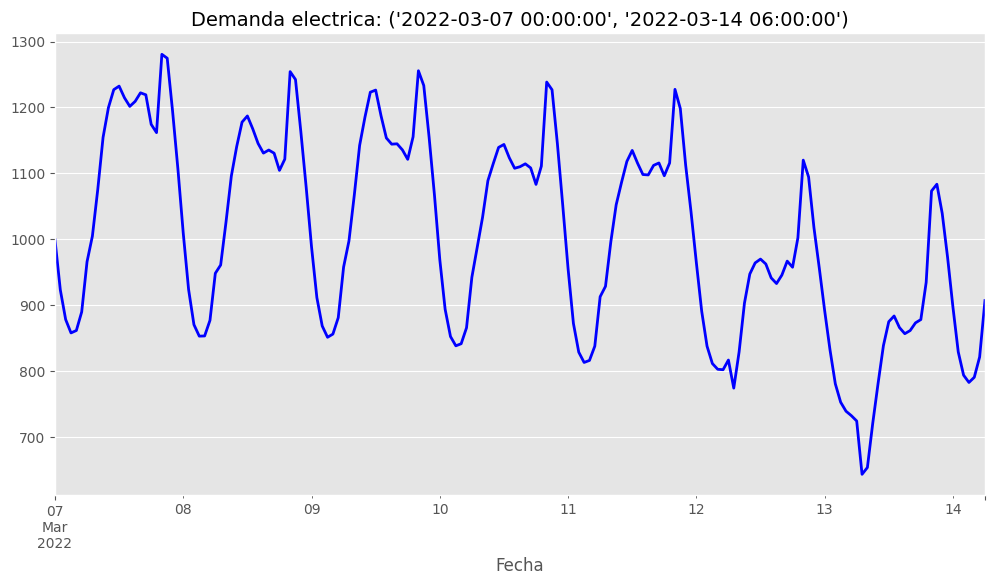

In [8]:
zoom_aux = ('2022-03-07 00:00:00', '2022-03-14 06:00:00')

plt.figure(figsize=(12, 6))

trainv6.loc[zoom_aux[0]: zoom_aux[1]].Demanda.plot(color='blue', linewidth=2)

plt.title(f'Demanda electrica: {zoom_aux}', fontsize=14)
plt.savefig('Demanda_semana.pdf')
plt.show()

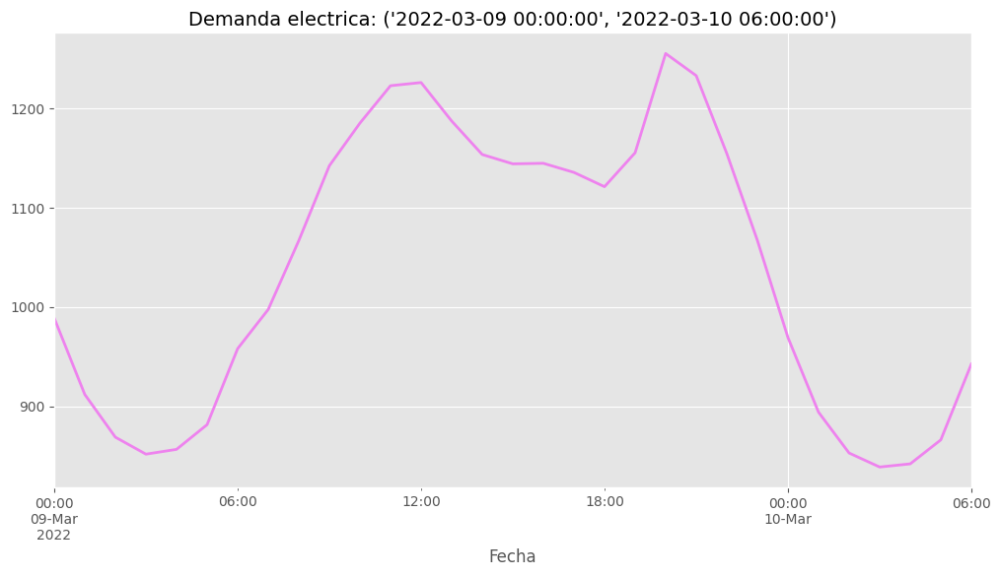

In [9]:
zoom = ('2022-03-09 00:00:00', '2022-03-10 06:00:00')

plt.figure(figsize=(12, 6))

trainv6.loc[zoom[0]: zoom[1]].Demanda.plot(color='violet', linewidth=2)

plt.title(f'Demanda electrica: {zoom}', fontsize=14)
plt.savefig('Demanda_dia.pdf')
plt.show()

### Estadísticas

#### Serie desestacionalizada

A continuacion la serie desestacionalizada con un modelo aditivo, la eleccion de la naturaleza de un modelo depende de la naturaleza de la serie temporal y cómo se comportan las componentes estacionales. Si las fluctuaciones estacionales tienen un efecto constante en la serie a lo largo del tiempo, es más apropiado utilizar un modelo aditivo. Si las fluctuaciones estacionales tienen un efecto proporcional en la serie, es más apropiado utilizar un modelo multiplicativo.

##### Modelo Aditivo

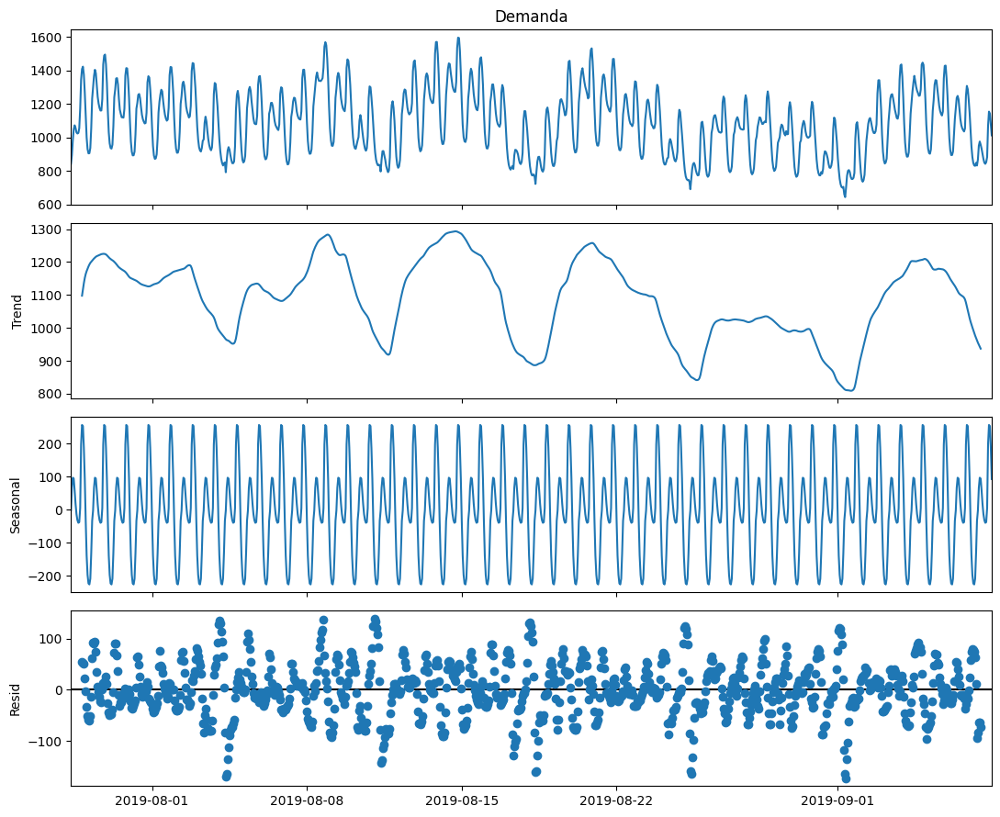

In [10]:
plt.style.use('default')
from statsmodels.tsa.seasonal import seasonal_decompose

# Seleccionar un rango específico de filas
serie_temporal1 = trainv6['Demanda'].iloc[5000:6000]

from pylab import rcParams
rcParams['figure.figsize'] = 11, 9

# Realizar la descomposición estacional
decomposition = seasonal_decompose(serie_temporal1,  model='additive', period=24)

# Graficar los resultados
decomposition.plot()
plt.show()

##### Modelo Multiplicativo

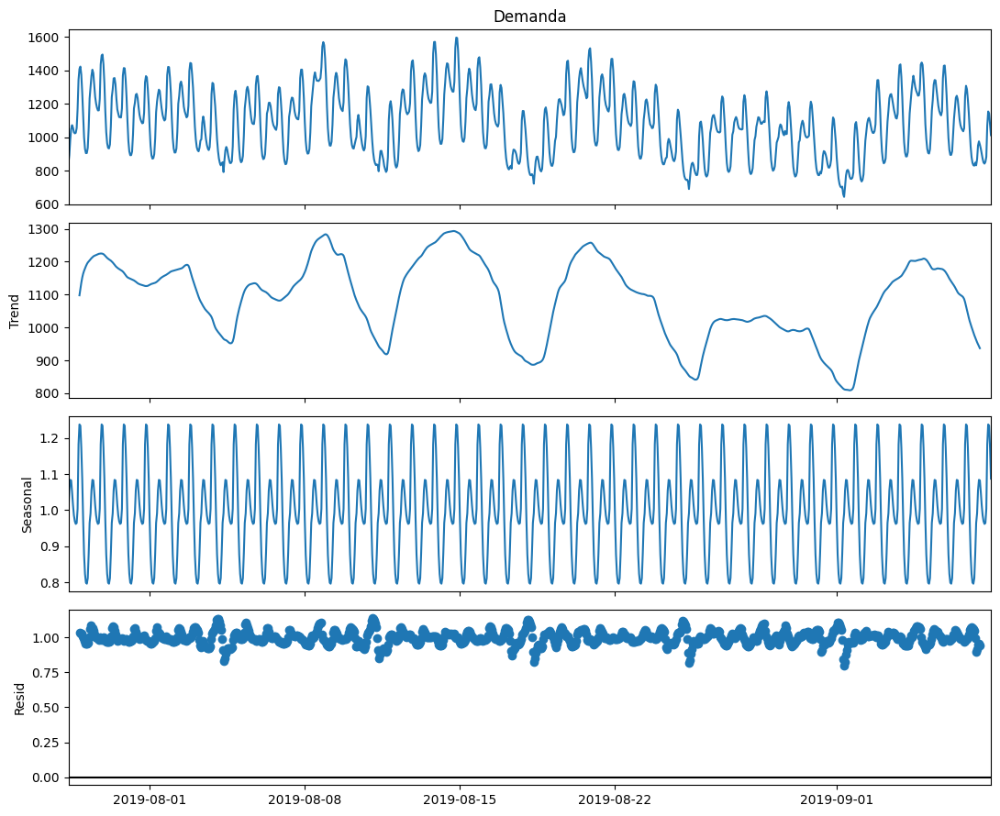

In [11]:
plt.style.use('default')
from statsmodels.tsa.seasonal import seasonal_decompose

# Seleccionar un rango específico de filas
serie_temporal2 = trainv6['Demanda'].iloc[5000:6000]

from pylab import rcParams
rcParams['figure.figsize'] = 11, 9

# Realizar la descomposición estacional
decomposition = seasonal_decompose(serie_temporal2,  model='multiplicative', period=24)

# Graficar los resultados
decomposition.plot()
plt.show()

##### Comparacion de ambos Modelos: 

In [12]:
# Modelo aditivo
valores_observados_aditivo = serie_temporal1.values
valores_predichos_aditivo = decomposition.trend + decomposition.seasonal

# Cálculo del RMSE (Error Cuadrático Medio)
rmse_aditivo = np.sqrt(np.mean((valores_observados_aditivo - valores_predichos_aditivo) ** 2))

# Cálculo del R-cuadrado (Coeficiente de Determinación)
sst = np.sum((valores_observados_aditivo - np.mean(valores_observados_aditivo)) ** 2)
ssr = np.sum((valores_observados_aditivo - valores_predichos_aditivo) ** 2)
r_cuadrado_aditivo = 1 - (ssr / sst)

# Modelo multiplicativo
valores_observados_multiplicativo = serie_temporal2.values
valores_predichos_multiplicativo = decomposition.trend * decomposition.seasonal

# Cálculo del RMSE (Error Cuadrático Medio)
rmse_multiplicativo = np.sqrt(np.mean((valores_observados_multiplicativo - valores_predichos_multiplicativo) ** 2))

# Cálculo del R-cuadrado (Coeficiente de Determinación)
sst = np.sum((valores_observados_multiplicativo - np.mean(valores_observados_multiplicativo)) ** 2)
ssr = np.sum((valores_observados_multiplicativo - valores_predichos_multiplicativo) ** 2)
r_cuadrado_multiplicativo = 1 - (ssr / sst)

# Mostrar las métricas
print("Métricas para el modelo aditivo:")
print("RMSE (aditivo):", rmse_aditivo)
print("R-cuadrado (aditivo):", r_cuadrado_aditivo)

print("Métricas para el modelo multiplicativo:")
print("RMSE (multiplicativo):", rmse_multiplicativo)
print("R-cuadrado (multiplicativo):", r_cuadrado_multiplicativo)

Métricas para el modelo aditivo:
RMSE (aditivo): 148.61466166962302
R-cuadrado (aditivo): 0.4254611026031
Métricas para el modelo multiplicativo:
RMSE (multiplicativo): 47.24457927367197
R-cuadrado (multiplicativo): 0.9419369167352374


Las métricas indican que el modelo multiplicativo tiene un RMSE significativamente más bajo (mejor ajuste a los datos y comete errores de predicción más pequeños) y un R-cuadrado más alto (mayor proporción de la variabilidad en los datos se explica mediante este modelo) en comparación con el modelo aditivo. Esto sugiere que el modelo multiplicativo se ajusta mejor a tus datos de serie temporal.

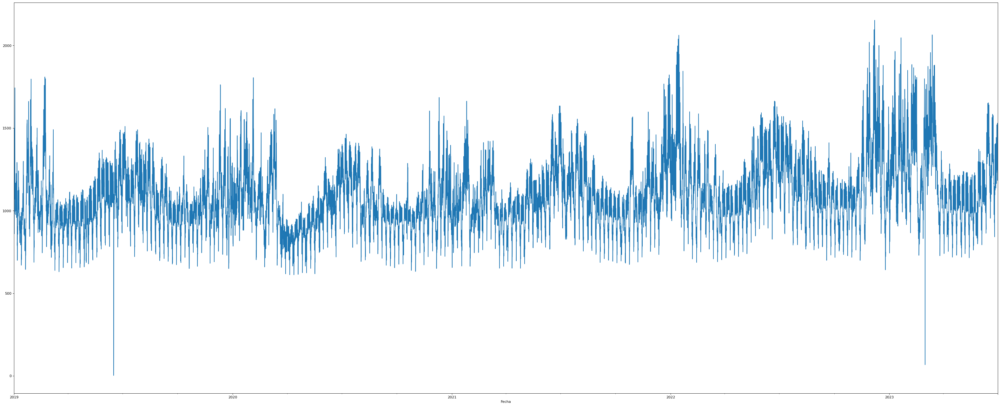

In [13]:
rcParams['figure.figsize'] = 11, 9
plt.figure(num=None, figsize=(50, 20), dpi=80, facecolor='w', edgecolor='k')
deseasonalized = seasonal_decompose(trainv6['Demanda'], model = 'multiplicative', period=24)
dem_deseasonalized = deseasonalized.observed / deseasonalized.seasonal
dem_deseasonalized.plot()
plt.show()

El ADF (Augmented Dickey-Fuller) test, o Prueba de Dickey-Fuller es una prueba de hipótesis estadística utilizada para determinar si una serie de tiempo es estacionaria o no estacionaria. Evaluar si una serie temporal tiene raíces unitarias, lo que indica la presencia de tendencia y no estacionariedad. Una raíz unitaria significa que la serie temporal no tiene una media constante y muestra un comportamiento de tendencia. En otras palabras, la serie está cambiando con el tiempo y no se encuentra en equilibrio.

El ADF test compara la serie temporal original con una versión diferenciada de sí misma. La hipótesis nula (H0) del ADF test es que la serie tiene raíces unitarias, lo que implica que no es estacionaria. La hipótesis alternativa (H1) es que la serie no tiene raíces unitarias, lo que implica que es estacionaria.

La prueba genera un estadístico y un valor p. Si el valor p es lo suficientemente bajo (generalmente por debajo de un umbral predefinido, como 0.05), podemos rechazar la hipótesis nula y concluir que la serie es estacionaria. Si el valor p es alto, no podemos rechazar la hipótesis nula y concluimos que la serie no es estacionaria.

In [14]:
# ADF Test
result = adfuller(dem_deseasonalized, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -13.836467556481317
p-value: 7.427379791348873e-26
Critial Values:
   1%, -3.430516181145039
Critial Values:
   5%, -2.8616134482152855
Critial Values:
   10%, -2.5668090941320756


Hay evidencia estadistica suficiente para rechazar la hipotesis nula sobre la existencia de raiz unitaria en la serie,el valor p es lo suficientemente bajo (menor a 0.05), podemos rechazar la hipótesis nula y concluir que la serie es estacionaria.

In [15]:
_ot_19 = pd.date_range('2019-03-21 00:00:00','2019-06-20 23:00:00', freq = 'H')
_ot_20 = pd.date_range('2020-03-21 00:00:00','2020-06-20 23:00:00', freq = 'H')
_ot_21 = pd.date_range('2021-03-21 00:00:00','2021-06-20 23:00:00', freq = 'H')
_ot_22 = pd.date_range('2022-03-21 00:00:00','2022-06-20 23:00:00', freq = 'H')
_ot_23 = pd.date_range('2023-03-21 00:00:00','2023-06-20 23:00:00', freq = 'H')

_spr_19 = pd.date_range('2019-09-21 00:00:00','2019-12-20 23:00:00', freq = 'H')
_spr_20 = pd.date_range('2020-09-21 00:00:00','2020-12-20 23:00:00', freq = 'H')
_spr_21 = pd.date_range('2021-09-21 00:00:00','2021-12-20 23:00:00', freq = 'H')
_spr_22 = pd.date_range('2022-09-21 00:00:00','2022-12-20 23:00:00', freq = 'H')
_spr_23 = pd.date_range('2023-09-21 00:00:00','2023-12-20 23:00:00', freq = 'H')

In [16]:
trainv6['Demanda'] = dem_deseasonalized.values
trainv6.groupby(['Estacion', 'Ano'])['Demanda'].describe()

count         mean         std         min          25%  \
Estacion  Ano                                                              
Invierno  2019  2208.0  1102.358870  154.023298  693.277396  1001.961812   
          2020  2208.0  1086.326269  163.537857  665.071550   966.885201   
          2021  2208.0  1114.916566  171.500754  686.710097  1002.017836   
          2022  2208.0  1166.975965  179.482335  699.390285  1049.869410   
          2023   240.0  1262.694513  150.246201  841.618194  1166.948928   
Otoño     2019  2208.0   988.966167  142.268092    2.693999   914.285310   
          2020  2208.0   915.441030  119.823786  611.992195   836.860801   
          2021  2208.0  1022.149809  143.435959  651.222880   943.053856   
          2022  2208.0  1097.030806  166.060198  702.776718   994.509781   
          2023  2208.0  1061.201540  145.598204  714.872665   969.023073   
Primavera 2019  2184.0  1017.023715  149.123884  649.565483   936.515433   
          2020  2184.0   992.704232  145.052138  632.144433   917.775839   
          2021  2184.0  1044.760362  160.645724  674.450256   957.041451   
          2022  2184.0  1161.755869  248.352829  699.076526  1015.385314   
Verano    2019  2160.0  1069.389664  205.831165  630.136116   936.184907   
          2020  2184.0  1118.876494  174.664471  659.467166  1002.243417   
          2021  2160.0  1107.338222  191.282001  655.795763   979.094276   
          2022  2160.0  1178.992358  237.724107  642.015409  1027.248024   
          2023  1896.0  1350.347367  249.787370   67.781664  1169.748044   

                        50%          75%          max  
Estacion  Ano                                          
Invierno  2019  1105.902435  1205.590431  1510.435471  
          2020  1080.318838  1211.486129  1463.691685  
          2021  1103.465331  1225.861762  1634.452728  
          2022  1155.342033  1294.987297  1663.766212  
          2023  1265.889890  1361.796503  1584.114722  
Otoño     2019   987.457143  1069.043649  1417.724530  
          2020   896.015100   991.016179  1322.556950  
          2021  1022.431780  1093.859762  1582.965747  
          2022  1073.221864  1203.160546  1593.430116  
          2023  1056.667578  1128.296554  1653.358071  
Primavera 2019  1003.977675  1086.266581  1762.743900  
          2020   982.985062  1047.244060  1685.786621  
          2021  1028.354286  1128.290325  1767.418203  
          2022  1107.606364  1283.768993  2152.853746  
Verano    2019  1032.334818  1171.584389  1809.740537  
          2020  1100.093607  1221.843151  1805.462642  
          2021  1079.674951  1210.982413  1822.268657  
          2022  1149.658468  1300.721820  2062.403706  
          2023  1356.573773  1517.789514  2064.676338

In [17]:
trainv6.groupby(['Tipo de dia', 'Ano'])['Demanda'].describe()

count         mean         std         min          25%  \
Tipo de dia Ano                                                              
Domingo     2019  1248.0   872.084500  147.189797    2.693999   768.011039   
            2020  1248.0   888.307293  152.404330  611.992195   775.044066   
            2021  1248.0   908.544155  149.152972  651.222880   796.681338   
            2022  1248.0   967.698116  189.469329  642.015409   823.964217   
            2023   624.0  1039.582598  234.620437  714.872665   872.727353   
Feriado     2019   360.0   968.950016  141.004864  649.429968   876.343655   
            2020   432.0   910.161454  123.911686  664.627960   826.964447   
            2021   360.0   969.351555  122.452304  655.795763   892.157918   
            2022   360.0  1064.000585  225.986556  785.782182   914.930619   
            2023   240.0  1000.166718  127.205858  718.762741   912.262712   
Habil       2019  5904.0  1101.089670  150.733349  805.926838   990.470336   
            2020  5856.0  1079.692671  159.747879  749.316820   965.999439   
            2021  5904.0  1129.780364  153.122173  823.260255  1017.137716   
            2022  5880.0  1213.196792  191.000404  869.392215  1074.006734   
            2023  2880.0  1267.646423  225.526099   67.781664  1085.705625   
Sábado      2019  1248.0   970.104387  129.734058  749.166351   873.802499   
            2020  1248.0   967.241161  138.382913  680.921785   861.472886   
            2021  1248.0   992.946164  136.832031  720.920639   885.782897   
            2022  1272.0  1068.003668  185.668338  798.897045   926.805921   
            2023   600.0  1111.461730  218.654014  830.354483   952.196561   

                          50%          75%          max  
Tipo de dia Ano                                          
Domingo     2019   864.823435   966.697463  1292.510795  
            2020   859.087997   982.633451  1389.742014  
            2021   874.804385  1001.910828  1436.426188  
            2022   922.417304  1058.016492  1748.565660  
            2023   956.569251  1161.520142  1748.942864  
Feriado     2019   965.972562  1085.086874  1328.131366  
            2020   884.613288   981.162077  1323.700957  
            2021   956.165100  1037.578696  1334.598183  
            2022  1004.414762  1130.756488  1913.959210  
            2023   966.596305  1100.519257  1346.532002  
Habil       2019  1066.110738  1181.902012  1809.740537  
            2020  1042.658911  1187.389204  1805.462642  
            2021  1093.885939  1209.613787  1822.268657  
            2022  1164.472183  1313.565909  2152.853746  
            2023  1208.658890  1423.700887  2064.676338  
Sábado      2019   948.158615  1056.238282  1558.722112  
            2020   946.344927  1065.713092  1441.095517  
            2021   967.439467  1077.091516  1427.552081  
            2022  1026.363008  1172.475242  1947.789548  
            2023  1031.607238  1225.110789  1750.613917

### Analisis de Variables

##### Prueba Augmented Dickey-Fuller (ADF) a las Variables

El Augmented Dickey-Fuller (ADF) test es una prueba de raíz unitaria que se utiliza para determinar si una serie temporal es estacionaria o no. La hipótesis nula del ADF es que la serie temporal tiene una raíz unitaria, es decir, no es estacionaria. Si el valor p (p-value) es menor que un umbral específico (como 0.05), se rechaza la hipótesis nula, lo que sugiere que la serie temporal es estacionaria.

In [18]:
from statsmodels.tsa.stattools import adfuller

columns_to_test = [
    'Ano',
    'Potencia maxima',
    'HHMM-num',
    'Demanda',
    'Temperatura',
    'Humedad', 
    'Acumulacion de lluvia',
    'Rafaga de viento'
]

# Definir el umbral de significancia para el p-value
p_value_threshold = 0.05

# Listas para almacenar variables estacionarias y no estacionarias
estacionarias = []
no_estacionarias = []

for column in columns_to_test:
    result = adfuller(trainv6[column], autolag='AIC')
    adf_statistic, p_value, _, _, _, _ = result
    
    print(f'ADF Statistic {column}: {adf_statistic}')
    print(f'p-value {column}: {p_value}')

    # Clasificar la variable como estacionaria o no estacionaria
    if p_value <= p_value_threshold:
        estacionarias.append(column)
    else:
        no_estacionarias.append(column)

    print('-' * 50)

# Mostrar listas finales
print("Variables estacionarias:", estacionarias)
print("Variables no estacionarias:", no_estacionarias)


ADF Statistic Ano: -0.4191433767123725
p-value Ano: 0.9068531194964438
--------------------------------------------------
ADF Statistic Potencia maxima: -12.412264146730974
p-value Potencia maxima: 4.317256327964864e-23
--------------------------------------------------
ADF Statistic HHMM-num: -21.57360529420436
p-value HHMM-num: 0.0
--------------------------------------------------
ADF Statistic Demanda: -13.836467556481317
p-value Demanda: 7.427379791348873e-26
--------------------------------------------------
ADF Statistic Temperatura: -10.302860810710364
p-value Temperatura: 3.3369294763795402e-18
--------------------------------------------------
ADF Statistic Humedad: -14.58266185063391
p-value Humedad: 4.442751935993995e-27
--------------------------------------------------
ADF Statistic Acumulacion de lluvia: -21.32722995156669
p-value Acumulacion de lluvia: 0.0
--------------------------------------------------
ADF Statistic Rafaga de viento: -15.401405733723832
p-value Rafa

Ahora sera necesario transformar variables categóricas en variables numéricas. En otras palabras, asigna un número entero único a cada categoría presente en una columna categórica.Cuando trabajas con algoritmos de aprendizaje automático, muchos de ellos requieren que todas las variables de entrada sean numéricas. LabelEncoder es útil en situaciones donde tienes variables categóricas (como nombres de ciudades, tipos de día, estaciones, etc.) y necesitas convertirlas a valores numéricos.

In [19]:
le = preprocessing.LabelEncoder()
trainv6['HHMM'] = le.fit_transform(trainv6['HHMM'])



#### Correlación de las Variables

##### Mapa de calor de Correlación

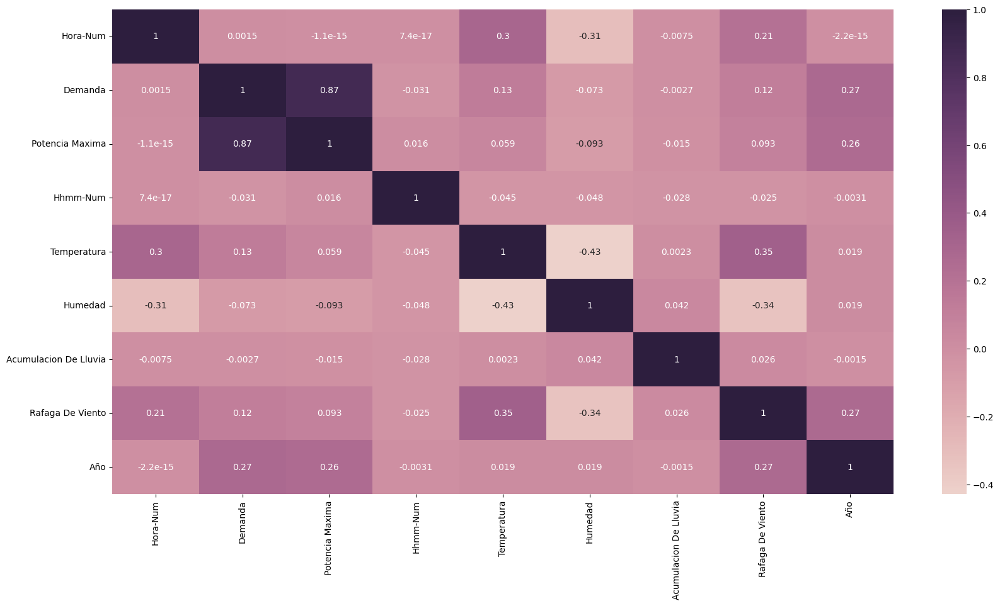

In [20]:
# Eliminar columnas no deseadas
columns_to_drop = [
       'Mes', 'Dia',
       'Dia de la semana',  'HHMM', 'E valle', 'E resto', 'E pico', 'E total',
       'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion','Ano'
  
]

# Renombrar las columnas deseadas
columns_to_rename = {
    'Cant vendidas aire acondicionados': 'Cantidad Vendidas Aire Acondicionados',
    'Variacion porcentual ': 'Variación EMAE'
}

# Eliminar columnas no deseadas y renombrar las demás
corr = trainv6.drop(columns=columns_to_drop)
corr.rename(columns=columns_to_rename, inplace=True)

# Calcular la matriz de correlación con el parámetro numeric_only=True
corr_matrix = corr.corr(numeric_only=True)

# Lista de nombres para las etiquetas de los ejes x e y
h_labels = [x.replace('_', ' ').title() for x in list(corr_matrix.columns.values)]

# Crear una figura y establecer el tamaño
fig, ax = plt.subplots(figsize=(20, 10))

# Crear el mapa de calor con anotaciones
sns.heatmap(
    corr_matrix,
    annot=True,
    xticklabels=h_labels,
    yticklabels=h_labels,
    cmap=sns.cubehelix_palette(as_cmap=True),
    ax=ax
)

# Guardar la figura en un archivo PNG (puedes cambiar el formato según tus preferencias)
plt.savefig('corr_adapted.png', bbox_inches='tight', pad_inches=0.5, transparent=True)

# Mostrar el gráfico
plt.show()



##### Correlación estadisticos Spearman y Kendall

La correlación lineal es un método estadístico que permite cuantificar la relación lineal existente entre dos variables, esta puede ser positiva, negativa o nula.  Existen varios estadísticos, llamados coeficientes de correlación lineal, desarrollados con el objetivo de medir este tipo de asociación, algunos de los más empleados son Pearson, Spearman y Kendall.

La correlación de Kendall es una medida no paramétrica de la relación entre dos variables ordinales. En general, es una buena elección cuando los datos no cumplen con los supuestos de normalidad y la relación no es necesariamente lineal.

En el análisis de correlación de Kendall, una variable se considera no correlacionada cuando el p-value asociado es alto (por ejemplo, mayor a 0.05), lo que sugiere que no hay evidencia estadística suficiente para rechazar la hipótesis nula de no correlación.

las variables que muestran correlación significativa con la demanda pueden ser importantes en la estimación y predicción de la demanda, y su inclusión en modelos predictivos podría mejorar la precisión de las predicciones.

In [21]:
_cols = [ 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num',  'Potencia maxima', 'HHMM-num',  'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento'
    ]

# Calcular correlaciones con la columna 'Demanda'
for col in _cols:
    if col != 'Demanda':
        corr, p_value = stats.kendalltau(trainv6['Demanda'], trainv6[col])
        corr_spearman, pvalue_spearman = stats.spearmanr(trainv6['Demanda'], trainv6[col])

        print(f"Kendall rank correlation coefficient {col}:", corr)
        print(f"Spearman rank correlation coefficient {col}:", corr_spearman)
        print("p-value:", p_value)
        print("p-value:", pvalue_spearman)
        print("-" * 50)

Kendall rank correlation coefficient Ano: 0.18507444893566716
Spearman rank correlation coefficient Ano: 0.25044308665653137
p-value: 0.0
p-value: 0.0
--------------------------------------------------
Kendall rank correlation coefficient Mes: -0.028327307590062935
Spearman rank correlation coefficient Mes: -0.041321233688834606
p-value: 5.466368226227145e-16
p-value: 2.2847434392152035e-16
--------------------------------------------------
Kendall rank correlation coefficient Dia: 0.015550439663304041
Spearman rank correlation coefficient Dia: 0.023596639107380992
p-value: 5.189393050207612e-06
p-value: 2.8026317847650878e-06
--------------------------------------------------
Kendall rank correlation coefficient Dia de la semana: -0.2214487389363241
Spearman rank correlation coefficient Dia de la semana: -0.3076527288642388
p-value: 0.0
p-value: 0.0
--------------------------------------------------
Kendall rank correlation coefficient Hora-num: 0.0009011963693691129
Spearman rank cor

In [22]:
# Crear una nueva columna 'Tipo de dia categ' con la categorización
trainv6['Tipo de dia categ'] = trainv6['Tipo de dia'].map({'Feriado': 0, 'Sábado': 1, 'Domingo': 3, 'Habil': 2})

# Crear dos grupos según la nueva columna 'Tipo de dia categ'
grupo_fds = trainv6[trainv6['Tipo de dia categ'].isin([0, 1, 3])]
grupo_habil = trainv6[trainv6['Tipo de dia categ'] == 2]

# Extraer las columnas de demanda para cada grupo
demanda_grupo_fds = grupo_fds['Demanda']
demanda_grupo_habil = grupo_habil['Demanda']


# Crear una nueva columna 'Estacion categ' con la categorización
trainv6['Estacion categ'] = trainv6['Estacion'].map({'Verano': 0, 'Primavera': 1, 'Otoño': 2, 'Invierno': 3})


# Crear dos grupos según la nueva columna 'Estacion categ'
grupo_verano_invierno = trainv6[trainv6['Estacion categ'].isin([0, 3])]
grupo_primavera_otono = trainv6[trainv6['Estacion categ'].isin([1, 2])]

# Extraer las columnas de demanda para cada grupo
demanda_grupo_verano_invierno = grupo_verano_invierno['Demanda']
demanda_grupo_primavera_otono = grupo_primavera_otono['Demanda']


In [23]:
# Extraer las columnas de demanda para cada grupo
demanda_grupo_fds = grupo_fds['Demanda'].astype(float)
demanda_grupo_habil = grupo_habil['Demanda'].astype(float)

# Ahora, realiza la prueba t de Student en las columnas numéricas
t_stat, p_value = stats.ttest_ind(demanda_grupo_fds, demanda_grupo_habil)

# Print the results
print("t-statistic:", t_stat)
print("p-value:", p_value)


t-statistic: -90.98345528836803
p-value: 0.0


In [24]:
# Extraer solo las columnas numéricas de demanda para cada grupo
demanda_grupo_verano_invierno = grupo_verano_invierno['Demanda']
demanda_grupo_primavera_otono = grupo_primavera_otono['Demanda']

# Realizar la prueba t solo en las columnas numéricas
t_stat, p_value = stats.ttest_ind(demanda_grupo_verano_invierno, demanda_grupo_primavera_otono)

# Print the results
print("t-statistic:", t_stat)
print("p-value:", p_value)


t-statistic: 56.41996485691276
p-value: 0.0


##### Coeficiente de Correlación r y r2

In [25]:
import pandas as pd
from sklearn.metrics import r2_score
from scipy.stats import pearsonr

# Lista de variables de interés
variables_of_interest = [
    'Hora-num',
    'Potencia maxima',
    'HHMM-num',
    'Temperatura',
    'Humedad',
    'Acumulacion de lluvia',
    'Rafaga de viento',
    'Ano',
    'Tipo de dia categ',
    'Estacion categ'
]

# Crear un DataFrame con las variables de interés y la columna 'Demanda'
selected_data = trainv6[variables_of_interest + ['Demanda']]

# Función para calcular la correlación
def calculate_correlation(df, target_col):
    corr_matrix = df.corr()
    results_df = pd.DataFrame(index=corr_matrix.columns, columns=['R', 'R2'])

    for col in corr_matrix.columns:
        r, _ = pearsonr(df[col], df[target_col])

        # Calcular R2 de manera diferente para evitar el problema de -Inf o NaN
        y_pred = df[col]
        ssr = sum((y_pred - df[target_col].mean())**2)
        sse = sum((df[target_col] - y_pred)**2)
        r_squared = 1 - (sse/ssr)
        
        results_df.at[col, 'R'] = r
        results_df.at[col, 'R2'] = r_squared

    return results_df

# Calcular la correlación para las variables seleccionadas
results = calculate_correlation(selected_data, 'Demanda')

# Mostrar el DataFrame con los resultados
print(results)



                              R        R2
Hora-num               0.001455 -0.034302
Potencia maxima         0.86885  0.319167
HHMM-num              -0.031386 -0.033647
Temperatura            0.132509 -0.034473
Humedad               -0.072606 -0.037875
Acumulacion de lluvia -0.002682 -0.033591
Rafaga de viento       0.117576 -0.036402
Ano                    0.271313 -0.045465
Tipo de dia categ     -0.021174 -0.033708
Estacion categ         -0.10644 -0.033716
Demanda                     1.0       1.0


In [26]:
# Supongamos que 'trainv6' es tu DataFrame
columnas_trainv6 = trainv6.columns.tolist()

# Muestra la lista de columnas
print(columnas_trainv6)

['Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento', 'Año', 'Tipo de dia categ', 'Estacion categ']


### RED NEURONAL MULTICAPA LSTM

In [29]:
# Seleccionar las columnas deseadas
columns_to_include = ['Mes', 'Dia', 'Hora-num', 'Demanda', 'Potencia maxima', 
                      'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento',
                      'Año', 'Tipo de dia categ', 'Estacion categ']

# Crear un nuevo DataFrame con las columnas seleccionadas
trainv6LSTM = trainv6[columns_to_include].copy()

# Mostrar las primeras filas del nuevo DataFrame
print(trainv6LSTM.head())


                     Mes  Dia  Hora-num      Demanda  Potencia maxima  \
Fecha                                                                   
2019-01-01 00:00:00    1    1         0   998.715118          1398.92   
2019-01-01 01:00:00    1    1         1  1076.702909          1398.92   
2019-01-01 02:00:00    1    1         2  1147.749681          1398.92   
2019-01-01 03:00:00    1    1         3  1174.174641          1398.92   
2019-01-01 04:00:00    1    1         4  1164.743753          1398.92   

                     Temperatura  Humedad  Acumulacion de lluvia  \
Fecha                                                              
2019-01-01 00:00:00        26.80    65.32                    0.0   
2019-01-01 01:00:00        26.55    65.62                    0.0   
2019-01-01 02:00:00        26.40    66.32                    0.0   
2019-01-01 03:00:00        26.40    66.75                    0.0   
2019-01-01 04:00:00        26.35    68.05                    0.0   

           

#### Pre Procesamiento de los datos

In [30]:
 # convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    #df = pd.DataFrame(data)
    df = data
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(data.shift(i))
        names += [('{}(t-{})'.format(j, i)) for j in data.columns]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('{}(t)'.format(j)) for j in data.columns]
        else:
            names += [('{}(t+{})'.format(j, i)) for j in data.columns]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [31]:
def weather_supervised(dataframe, n_in, n_out):
    df = dataframe.copy()
    df.pop('Demanda')
    return series_to_supervised(data = df, n_in = n_in, n_out = n_out, dropnan=True)

def electric_supervised(dataframe, n_in, n_out):
    elec = pd.DataFrame(dataframe['Demanda'])
    elec_sup = series_to_supervised(data = elec, n_in = n_in, n_out = n_out, dropnan=True)
    return elec_sup

In [33]:
Demanda = electric_supervised(trainv6LSTM, 24, 6)
weather = weather_supervised(trainv6LSTM, 24, 6)
full = weather.iloc[:,:-6*9].join(Demanda)

In [34]:
full.columns

Index(['Mes(t-24)', 'Dia(t-24)', 'Hora-num(t-24)', 'Potencia maxima(t-24)',
       'Temperatura(t-24)', 'Humedad(t-24)', 'Acumulacion de lluvia(t-24)',
       'Rafaga de viento(t-24)', 'Año(t-24)', 'Tipo de dia categ(t-24)',
       ...
       'Demanda(t-4)', 'Demanda(t-3)', 'Demanda(t-2)', 'Demanda(t-1)',
       'Demanda(t)', 'Demanda(t+1)', 'Demanda(t+2)', 'Demanda(t+3)',
       'Demanda(t+4)', 'Demanda(t+5)'],
      dtype='object', length=306)

In [35]:
X = full.iloc[:,:-6]
y = full.iloc[:,-6:]

In [36]:
X.shape, y.shape

((39379, 300), (39379, 6))

In [37]:
mm = MinMaxScaler()
ss = StandardScaler()
X_ss = ss.fit_transform(X)
y_mm = mm.fit_transform(y) 

In [38]:
#We split the data into 2/3 of the time for training and 1/3 for testing 
#which would lead to 2 years for training and one year fo testing
train_hours = int(2*full.shape[0]/3)

X_train = X_ss[:train_hours, :]
X_test = X_ss[train_hours:, :]
y_train = y_mm[:train_hours, :]
y_test = y_mm[train_hours:, :]

#to tensors and variables
X_train_tensors = Variable(torch.Tensor(X_train))
X_test_tensors = Variable(torch.Tensor(X_test))

y_train_tensors = Variable(torch.Tensor(y_train))
y_test_tensors = Variable(torch.Tensor(y_test)) 

In [39]:
#reshaping to rows, timestamps, features
seq = 1
X_train_tensors_final = torch.reshape(X_train_tensors,   (int(X_train_tensors.shape[0]/seq), seq, X_train_tensors.shape[1]))
X_test_tensors_final = torch.reshape(X_test_tensors,  (int(X_test_tensors.shape[0]/seq), seq, X_test_tensors.shape[1])) 

In [40]:
X_train_tensors_final.shape

torch.Size([26252, 1, 300])

#### Construcción del Modelo

In [41]:
class LSTM_E_2(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, seq_length, num_dir, device):
        super(LSTM_E_2, self).__init__()

        self.device = device
        self.num_classes = num_classes #number of outputs
        self.num_layers = num_layers #number of layers
        self.input_size = input_size #input size
        self.hidden_size = hidden_size #hidden state
        self.seq_length = seq_length #sequence length
        self.num_directions = num_dir

        if num_dir == 2:
            bi = True
        else: 
            bi = False

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers, batch_first=True, bidirectional = bi ) #lstm
        self.fc_1 =  nn.Linear(hidden_size*num_dir, 300) #fully connected 1
        self.fc = nn.Linear(300, num_classes) #fully connected last layer

        self.relu = nn.ReLU() 

    def forward(self,x):
        h_0 = Variable(torch.zeros(
              self.num_layers*self.num_directions, x.size(0), self.hidden_size)).to(self.device) #hidden state
        c_0 = Variable(torch.zeros(
            self.num_layers*self.num_directions, x.size(0), self.hidden_size)).to(self.device) #internal state

        # Propagate input through LSTM
        output, (hn, cn) = self.lstm(x, (h_0, c_0)) #lstm with input, hidden, and internal state
        #print(output.shape)
        out = output.view(-1, self.hidden_size*self.num_directions) #reshaping the data for Dense layer next
        #print(out.shape)
        out = self.relu(out)
        out = self.fc_1(out) #first Dense
        out = self.relu(out) #relu
        out = self.fc(out) #Final Output
        #print(out.shape)
        
        return out 

In [42]:
#checking if there are any saved model checkpoint
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    
if os.path.isfile('./data/models/model_2_checkpoint.tar'):
    #load the model
    model = LSTM_E_2(num_classes = 6, input_size = X_train_tensors_final.shape[2], hidden_size=133, num_layers=1, seq_length=X_train_tensors_final.shape[1],  num_dir = 1, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    model.to(device)
    # Make sure to call input = input.to(device) on any input tensors that you feed to the model

    checkpoint = torch.load('./data/models/model_2_checkpoint.tar', map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    print(model)
    
else:
    model = LSTM_E_2(num_classes = 6, input_size = X_train_tensors_final.shape[2], hidden_size=133, num_layers=1, seq_length=X_train_tensors_final.shape[1],  num_dir = 1, device=device)
    model.to(device)
    print(model)

LSTM_E_2(
  (lstm): LSTM(300, 133, batch_first=True)
  (fc_1): Linear(in_features=133, out_features=300, bias=True)
  (fc): Linear(in_features=300, out_features=6, bias=True)
  (relu): ReLU()
)


In [43]:
learning_rate = 0.001 #0.001 lr
criterion = torch.nn.MSELoss()    # mean-squared error for regression
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) 
num_epochs = 700 

Epoch: 0, loss: 0.23567, val_loss: 0.26589
Epoch: 50, loss: 0.00178, val_loss: 0.00350
Epoch: 100, loss: 0.00096, val_loss: 0.00344
Epoch: 150, loss: 0.00066, val_loss: 0.00291
Epoch: 200, loss: 0.00050, val_loss: 0.00238
Epoch: 250, loss: 0.00040, val_loss: 0.00206
Epoch: 300, loss: 0.00034, val_loss: 0.00182
Epoch: 350, loss: 0.00029, val_loss: 0.00166
Epoch: 400, loss: 0.00026, val_loss: 0.00155
Epoch: 450, loss: 0.00024, val_loss: 0.00149
Epoch: 500, loss: 0.00022, val_loss: 0.00145
Epoch: 550, loss: 0.00020, val_loss: 0.00142
Epoch: 600, loss: 0.00019, val_loss: 0.00142
Epoch: 650, loss: 0.00018, val_loss: 0.00142


Text(0, 0.5, 'MSE loss')

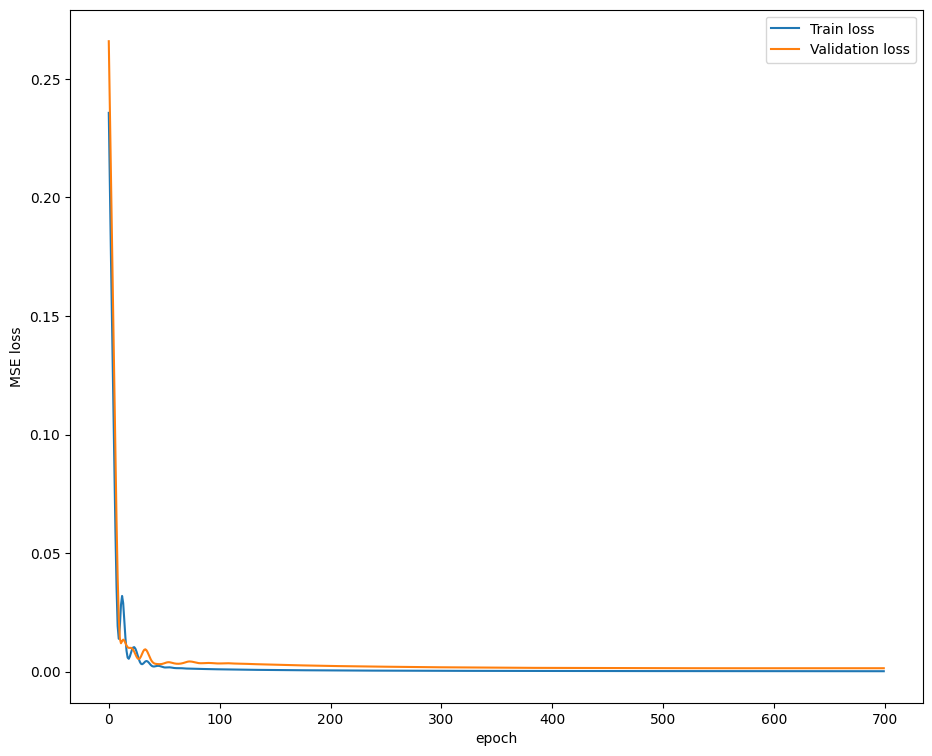

In [45]:
#train 1
model.train()

train_loss = []
val_loss = []
X_test_tensors_final = X_test_tensors_final.to(device)
y_test_tensors = y_test_tensors.to(device)
X_train_tensors_final = X_train_tensors_final.to(device)
y_train_tensors = y_train_tensors.to(device)

for epoch in range(num_epochs):
    outputs = model.forward(X_train_tensors_final)  # forward pass
    optimizer.zero_grad()  # calculate the gradient, manually setting to 0
    # obtain the batch loss 
    loss = criterion(outputs, y_train_tensors)
    train_loss.append(loss.item())
    loss.backward()  # calculates the loss of the loss function
    optimizer.step()  # improve from loss, i.e backpropagation

    # validation
    val_out = model.forward(X_test_tensors_final)
    loss_val = criterion(val_out, y_test_tensors)
    val_loss.append(loss_val.item())

    if epoch % 50 == 0:
        print("Epoch: %d, loss: %1.5f, val_loss: %1.5f" % (epoch, train_loss[epoch], val_loss[epoch])) 

# plotting
epoch = np.arange(0, num_epochs)
plt.plot(epoch, train_loss, label="Train loss")
plt.plot(epoch, val_loss, label="Validation loss")
plt.legend()
plt.xlabel('epoch')
plt.ylabel('MSE loss')


In [46]:
#to save model you'll have to train/keep training the model
torch.save({
            'epoch': len(epoch),
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss.item(),
            }, r'D:\modelo\tu_modelo_checkpoint.tar')

#### Validación del modelo 

In [47]:
df_X_ss = ss.transform(full.iloc[:,:-6]) #old transformers
df_y_mm = mm.transform(full.iloc[:,-6:]) #old transformers
df_X_ss = Variable(torch.Tensor(df_X_ss)) #converting to Tensors
df_y_mm = Variable(torch.Tensor(df_y_mm))
#reshaping the dataset
df_X_ss = torch.reshape(df_X_ss, (df_X_ss.shape[0], 1, df_X_ss.shape[1])) 

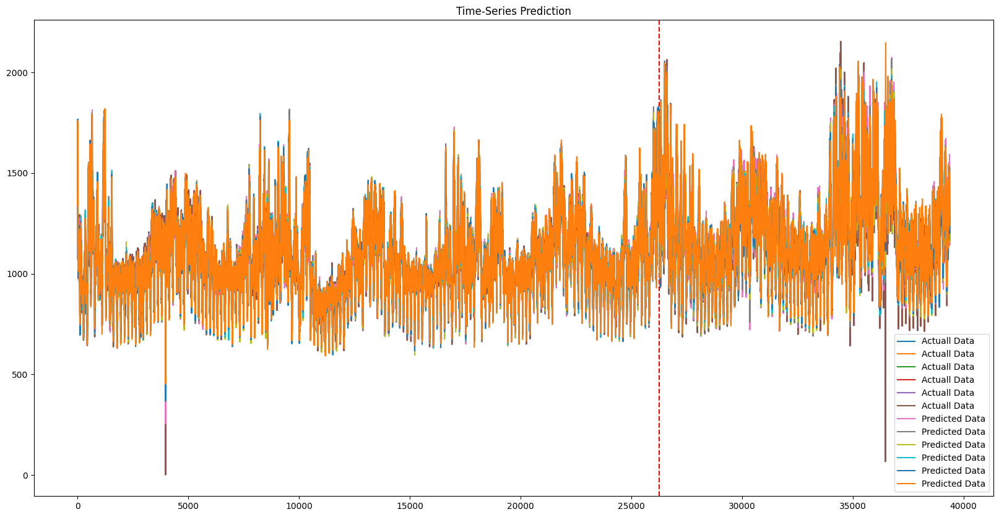

Test RMSE: 52.061


In [48]:
model.eval()

train_predict = model(df_X_ss.to(device))#forward pass
data_predict = train_predict.cpu().data.numpy() #numpy conversion
dataY_plot = df_y_mm.data.numpy()

data_predict = mm.inverse_transform(data_predict) #reverse transformation
dataY_plot = mm.inverse_transform(dataY_plot)

plt.figure(figsize=(20,10)) #plotting
plt.axvline(x=train_hours, c='r', linestyle='--') #size of the training set

plt.plot(dataY_plot, label='Actuall Data') #actual plot
plt.plot(data_predict, label='Predicted Data') #predicted plot
plt.title('Time-Series Prediction')
plt.legend()
plt.show() 

rmse = np.sqrt(mean_squared_error(dataY_plot, data_predict ))
print('Test RMSE: %.3f' % rmse)

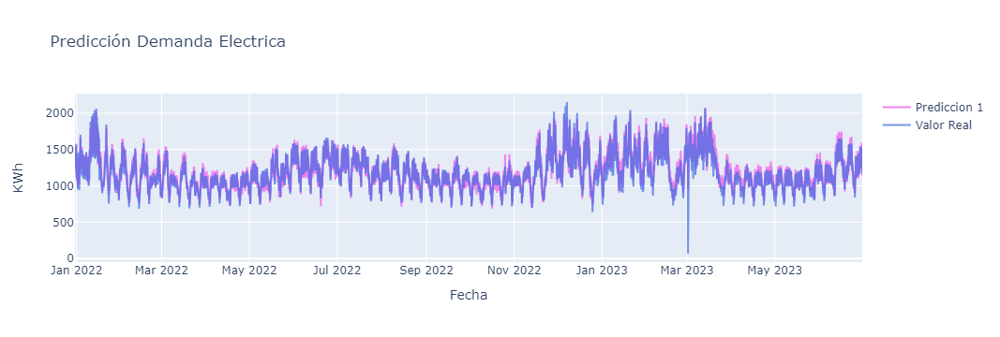

In [51]:
Predicted = go.Scatter(x=y[train_hours:].index, y=data_predict[train_hours:,0].flatten(), opacity = 1, name = 'Prediccion 1', line=dict(color='violet'), yaxis='y')
Actual = go.Scatter(x=y[train_hours:].index, y=y['Demanda(t)'][train_hours:].values, opacity = 0.7, name = 'Valor Real', line=dict(color='royalBlue'), yaxis='y')
layout = go.Layout(title='Predicción Demanda Electrica', xaxis=dict(title='Fecha'),
                   yaxis=dict(title='KWh', overlaying='y'),
                  yaxis2=dict(title='KWh', side='right'))
fig = go.Figure(data=[Predicted, Actual], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.

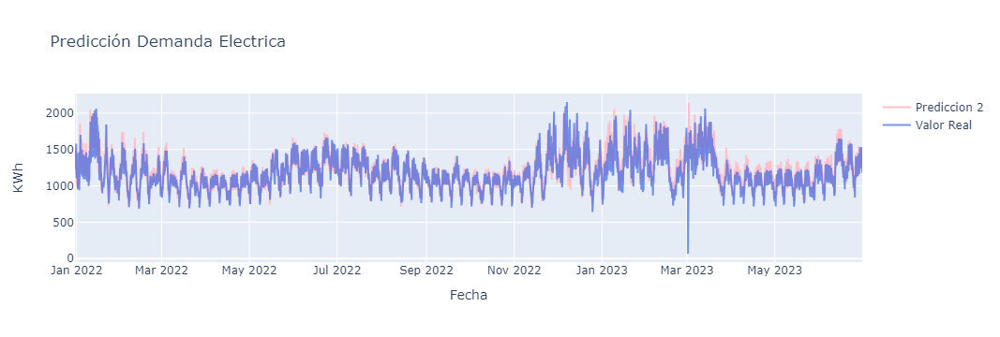

In [53]:
Predicted = go.Scatter(x=y[train_hours:].index, y=data_predict[train_hours:,5].flatten(), opacity = 1, name = 'Prediccion 2', line=dict(color='pink'), yaxis='y')
Actual = go.Scatter(x=y[train_hours:].index, y=y['Demanda(t)'][train_hours:].values, opacity = 0.7, name = 'Valor Real', line=dict(color='royalBlue'), yaxis='y')
layout = go.Layout(title='Predicción Demanda Electrica', xaxis=dict(title='Fecha'),
                   yaxis=dict(title='KWh', overlaying='y'),
                  yaxis2=dict(title='KWh', side='right'))
fig = go.Figure(data=[Predicted, Actual], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.